In [14]:

# Modules standards
import os  # J'emploie ce module pour manipuler les interactions avec le système d'exploitation, comme la gestion de fichiers et de dossiers.

# Bibliothèques tierces pour le calcul et le traitement des données
import numpy as np  # Cette bibliothèque sert aux calculs numériques avancés et au traitement des tableaux multi-dimensionnels.
import pandas as pd  # J'opte pour pandas afin de gérer, organiser et analyser des données en format tabulaire.

# Bibliothèques pour le machine learning et le deep learning
import tensorflow as tf  # TensorFlow constitue le framework principal pour le machine learning et le deep learning.
from tensorflow.keras import layers, models  # Ces modules me permettent de structurer et construire des réseaux de neurones.
from tensorflow.keras.preprocessing import image_dataset_from_directory  # Cette fonction m’aide à extraire un dataset d’images depuis un répertoire.
from tensorflow.keras.models import Model  # J’utilise cette classe de base pour définir et gérer des modèles Keras.
from tensorflow.keras.regularizers import l2  # La régularisation L2 aide à réduire le surapprentissage en ajoutant une pénalité aux poids du modèle.

# Bibliothèques pour le traitement d'images et la visualisation
import cv2  # J'exploite cv2 pour traiter les images et vidéos, avec des opérations comme le redimensionnement et le filtrage.
from PIL import Image  # PIL facilite la manipulation des images, comme l'ouverture, la transformation et la sauvegarde.
import matplotlib  # Matplotlib permet de construire des visualisations de données.
import matplotlib.pyplot as plt  # J’utilise plt pour générer des graphiques et visualiser des données avec simplicité.

# Bibliothèques pour l'évaluation et le suivi des modèles
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay  # J'emploie ces fonctions pour évaluer les performances de mes modèles.
from sklearn.utils import class_weight  # Cette fonction calcule les poids des classes et aide à gérer les déséquilibres dans les données.
from sklearn import __version__ as sklearn_version  # J'accède à la version installée de scikit-learn avec ce module.

# Bibliothèques pour le suivi des expériences et les requêtes HTTP
import mlflow  # J'utilise mlflow pour suivre et gérer le cycle de vie de mes expériences en machine learning.
import requests  # Cette bibliothèque me permet d'effectuer des requêtes HTTP, notamment pour interagir avec des API.

# Bibliothèques pour l'interface utilisateur et la gestion des fichiers
import tkinter as tk  # J'emploie tkinter pour construire une interface graphique basique.
from tkinter import filedialog  # filedialog facilite l’ouverture de boîtes de dialogue pour la sélection de fichiers.
import random  # Ce module sert à gérer des opérations aléatoires.
from collections import Counter  # Counter simplifie le comptage des occurrences de valeurs dans une collection.

# Import des librairies pour MLflow pour le suivi des expériences
from mlflow import MlflowClient
import mlflow
import requests



In [ ]:

# Je configure MLflow pour le suivi des expériences en définissant l'URL du serveur et en créant une expérience nommée "champi".

# Initialisation de l'URL de MLflow
mlflow_server_uri = "https://champi.heuzef.com"

# Configuration de MLflow avec l'URL du serveur de tracking
mlflow.set_tracking_uri(mlflow_server_uri)
mlflow.set_experiment("champi")  # Nom de l'expérience

# Je définis une fonction pour vérifier la disponibilité du serveur MLflow
def is_mlflow_tracking_server_available(mlflow_server_uri):
    try:
        response = requests.get(mlflow_server_uri)
        if response.status_code == 200:
            return True
        else:
            return False
    except requests.exceptions.RequestException:
        return False

# Je vérifie si le serveur MLflow est disponible
if is_mlflow_tracking_server_available(mlflow_server_uri):
    print("Le serveur de tracking MLflow est disponible :", mlflow_server_uri)
else:
    print("Le serveur de tracking MLflow n'est pas disponible.")

# Je tente de me connecter au serveur MLflow
try:
    requests.get(mlflow_server_uri)
except Exception as e:
    print(f"Erreur lors de la connexion au serveur MLflow : {e}")


Le serveur de tracking MLflow est disponible : https://champi.heuzef.com


In [16]:
# Extraction des versions des bibliothèques
versions = {
    "numpy": np.__version__,
    "tensorflow": tf.__version__,
    "matplotlib": matplotlib.__version__,
    "scikit-learn": sklearn_version,
    "PIL": Image.__version__,
    "cv2": cv2.__version__,
    "pandas": pd.__version__
}

# Affichage des versions
for lib, version in versions.items():
    print(f"{lib}: {version}")



numpy: 1.26.4
tensorflow: 2.10.0
matplotlib: 3.9.2
scikit-learn: 1.5.2
PIL: 10.4.0
cv2: 4.10.0
pandas: 2.2.3


In [17]:
# *****************************
# ***** Chargement des Données *****
# *****************************

# Définition des chemins des répertoires
base_dir = 'E:/Datas Champi'  # Chemin de base contenant les répertoires d'entraînement, de validation et de test
train_dir = os.path.join(base_dir, 'balanced_train')  # Répertoire des données d'entraînement
validation_dir = os.path.join(base_dir, 'balanced_validation')  # Répertoire des données de validation
test_dir = os.path.join(base_dir, 'test')  # Répertoire des données de test

# Vérification de l'existence des répertoires
for directory in [train_dir, validation_dir, test_dir]:
    if not os.path.isdir(directory):
        raise FileNotFoundError(f"Le répertoire spécifié n'existe pas : {directory}")

# Paramètres
batch_size = 32  # Nombre d'exemples par batch
img_height = 224  # Hauteur des images redimensionnées
img_width = 224  # Largeur des images redimensionnées
AUTOTUNE = tf.data.AUTOTUNE  # Optimisation du préchargement des données
image_size = (img_height, img_width)  # Taille des images



In [18]:
# Chargement des ensembles de données sans rescaling
train_ds = image_dataset_from_directory(
    train_dir,
    labels='inferred',  # Les étiquettes sont déduites des noms des sous-répertoires
    label_mode='int',  # Utilisé avec 'sparse_categorical_crossentropy'
    batch_size=batch_size,
    image_size=(img_height, img_width),  # Redimensionne les images
    shuffle=True,  # Mélange les données d'entraînement
    seed=123,  # Pour reproductibilité
    interpolation='bilinear'  # Méthode d'interpolation pour le redimensionnement
)

validation_ds = image_dataset_from_directory(
    validation_dir,
    labels='inferred',
    label_mode='int',
    batch_size=batch_size,
    image_size=(img_height, img_width),
    shuffle=False,  # Ne pas mélanger les données de validation
    seed=123,
    interpolation='bilinear'
)

test_ds = image_dataset_from_directory(
    test_dir,
    labels='inferred',
    label_mode='int',
    batch_size=batch_size,
    image_size=(img_height, img_width),
    shuffle=False,  # Ne pas mélanger les données de test
    seed=123,
    interpolation='bilinear'
)


Found 48329 files belonging to 23 classes.
Found 47336 files belonging to 23 classes.
Found 115 files belonging to 23 classes.


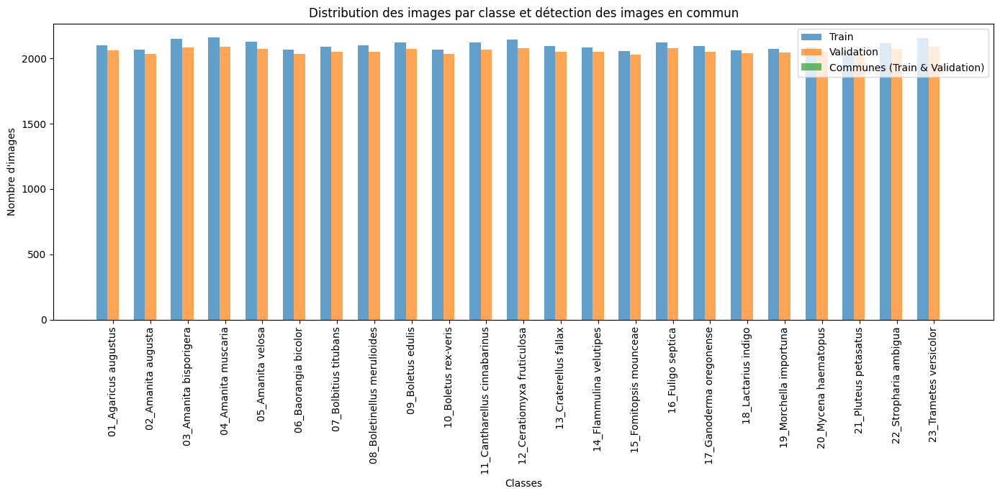

In [19]:
#Check des images pour vérifier si pas de doublons

# Dictionnaires pour compter les images par classe et les images en commun
train_counts = Counter()
val_counts = Counter()
common_counts = Counter()

# Parcourir chaque classe dans le dossier train
for class_name in os.listdir(train_dir):
    train_class_dir = os.path.join(train_dir, class_name)
    val_class_dir = os.path.join(validation_dir, class_name)
    
    # Récupérer les noms des images dans train et validation pour la classe actuelle
    if os.path.isdir(train_class_dir) and os.path.isdir(val_class_dir):
        train_images = set(os.listdir(train_class_dir))
        val_images = set(os.listdir(val_class_dir))
        
        # Compter les images par classe dans train et validation
        train_counts[class_name] = len(train_images)
        val_counts[class_name] = len(val_images)
        
        # Trouver les images en commun et les compter
        common_images = train_images.intersection(val_images)
        common_counts[class_name] = len(common_images)

# Création du graphique
classes = list(train_counts.keys())
total_train_images = [train_counts[cls] for cls in classes]
total_val_images = [val_counts[cls] for cls in classes]
common_images = [common_counts[cls] for cls in classes]

fig, ax = plt.subplots(figsize=(14, 7))
width = 0.3  # Largeur des barres

# Plot du nombre d'images total par classe dans train et validation
ax.bar([i - width for i in range(len(classes))], total_train_images, width=width, label='Train', alpha=0.7)
ax.bar([i for i in range(len(classes))], total_val_images, width=width, label='Validation', alpha=0.7)
ax.bar([i + width for i in range(len(classes))], common_images, width=width, label='Communes (Train & Validation)', alpha=0.7)

#labels et titre
ax.set_xlabel('Classes')
ax.set_ylabel('Nombre d\'images')
ax.set_title('Distribution des images par classe et détection des images en commun')
ax.set_xticks(range(len(classes)))
ax.set_xticklabels(classes, rotation=90)
ax.legend()

plt.tight_layout()
plt.show()


In [20]:
# Extraire les noms des classes avant d'appliquer .prefetch()
class_names = train_ds.class_names  # Liste des noms des classes
num_classes = len(class_names)  # Nombre total de classes
print(f"Classes détectées ({num_classes}) : {class_names}")  # Affichage des classes détectées

#poids des classses
# Initialiser un compteur pour les classes
class_counts = np.zeros(num_classes, dtype=int)  # Tableau pour stocker le nombre d'images par classe

# Parcourir le dataset d'entraînement pour compter les échantillons par classe
for images, labels in train_ds:
    labels = labels.numpy()  # Convertir les labels en tableau NumPy
    for label in labels:
        class_counts[label] += 1  # Incrémenter le compteur pour la classe correspondante

print(f"Nombre d'échantillons par classe : {class_counts}")  # Affichage des nombres d'images par classe

# Calculer les poids des classes
# Récupérer toutes les étiquettes de l'ensemble d'entraînement
y_train = np.concatenate([y.numpy() for x, y in train_ds], axis=0)  # Concaténer toutes les étiquettes

# Calculer les poids des classes pour gérer le déséquilibre
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',  # Calcule des poids équilibrés
    classes=np.unique(y_train),  # Classes uniques dans les étiquettes
    y=y_train  # Étiquettes de l'ensemble d'entraînement
)

# Convertir les poids en dictionnaire {classe: poids}
class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}
print(f"Poids des classes : {class_weights_dict}")  # Affichage des poids des classes



Classes détectées (23) : ['01_Agaricus augustus', '02_Amanita augusta', '03_Amanita bisporigera', '04_Amanita muscaria', '05_Amanita velosa', '06_Baorangia bicolor', '07_Bolbitius titubans', '08_Boletinellus merulioides', '09_Boletus edulis', '10_Boletus rex-veris', '11_Cantharellus cinnabarinus', '12_Ceratiomyxa fruticulosa', '13_Craterellus fallax', '14_Flammulina velutipes', '15_Fomitopsis mounceae', '16_Fuligo septica', '17_Ganoderma oregonense', '18_Lactarius indigo', '19_Morchella importuna', '20_Mycena haematopus', '21_Pluteus petasatus', '22_Stropharia ambigua', '23_Trametes versicolor']
Nombre d'échantillons par classe : [2101 2066 2152 2159 2129 2070 2091 2100 2122 2068 2122 2146 2093 2082
 2057 2125 2094 2065 2076 2085 2050 2119 2157]
Poids des classes : {0: 1.0001241644765433, 1: 1.0170672166336967, 2: 0.9764223371585583, 3: 0.9732565398634634, 4: 0.9869708170808912, 5: 1.0151018693551774, 6: 1.004907159046015, 7: 1.0006004140786748, 8: 0.9902266114821948, 9: 1.016083592633

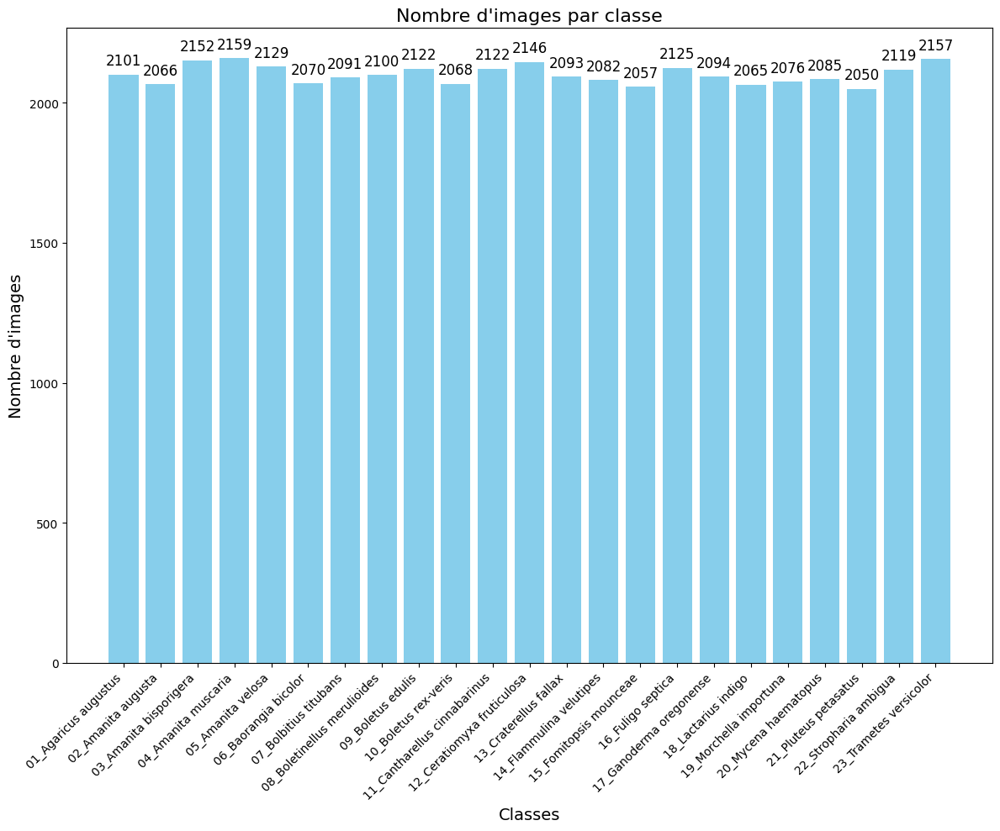

In [21]:

# *****************************
# ***** Visualisation du Nombre d'Images par Classe pour le train *****
# *****************************

# Créer une figure avec une taille appropriée
plt.figure(figsize=(12, 10))  # Taille de la figure (largeur, hauteur) en pouces

# Créer un graphique à barres pour le nombre d'images par classe
plt.bar(class_names, class_counts, color='skyblue')  # Barres verticales avec une couleur spécifique

# Ajouter un titre au graphique
plt.title('Nombre d\'images par classe', fontsize=16)  # Titre du graphique avec une taille de police

# Ajouter une étiquette à l'axe des x
plt.xlabel('Classes', fontsize=14)  # Étiquette de l'axe des x avec une taille de police

# Ajouter une étiquette à l'axe des y
plt.ylabel('Nombre d\'images', fontsize=14)  # Étiquette de l'axe des y avec une taille de police

# Faire pivoter les étiquettes de l'axe des x si les noms de classes sont longs
plt.xticks(rotation=45, ha='right')  # Rotation des labels de 45 degrés et alignement à droite

# Ajouter des annotations pour afficher le nombre d'images au-dessus de chaque barre
for index, count in enumerate(class_counts):
    plt.text(index, count + max(class_counts)*0.01, str(count), ha='center', va='bottom', fontsize=12)  # Texte au-dessus de chaque barre

# Ajuster la mise en page pour éviter que les étiquettes ne soient coupées
plt.tight_layout()  # Ajustement automatique des paramètres de la figure

# Afficher le graphique
plt.show()  # Affiche le graphique à l'écran



In [22]:
# *****************************
# ***** Optimisation des Performances *****
# *****************************

# Appliquer .prefetch() après avoir extrait class_names et calculé class_weights
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)  # Précharge les données d'entraînement
validation_ds = validation_ds.prefetch(buffer_size=AUTOTUNE)  # Précharge les données de validation
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)  # Précharge les données de test



In [23]:
# *****************************
# ***** Fonctions Utilitaires *****
# *****************************

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """
    Génère une heatmap Grad-CAM pour une image donnée.

    Parameters:
    - img_array (numpy.ndarray): Tableau représentant l'image.
    - model (tf.keras.Model): Modèle entraîné.
    - last_conv_layer_name (str): Nom de la dernière couche convolutionnelle.
    - pred_index (int, optional): Indice de la classe pour laquelle générer la heatmap. 
                                   Si None, utilise la classe prédite.

    Returns:
    - numpy.ndarray: Heatmap Grad-CAM normalisée entre 0 et 1.
    """
    grad_model = Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()

    return heatmap

def superimpose_heatmap(img, heatmap, alpha=0.4):
    """
    Superpose une heatmap Grad-CAM sur une image originale.

    Parameters:
    - img (PIL.Image.Image): Image originale.
    - heatmap (numpy.ndarray): Heatmap Grad-CAM générée.
    - alpha (float): Transparence de la heatmap superposée.

    Returns:
    - PIL.Image.Image: Image superposée avec la heatmap.
    """
    # Redimensionner la heatmap à la taille de l'image
    heatmap = cv2.resize(heatmap, (img_width, img_height))

    # Appliquer la colormap 'jet' à la heatmap
    heatmap = np.uint8(255 * heatmap)
    jet = plt.get_cmap("jet")
    jet_colors = jet(heatmap)[:, :, :3]  # Ignorer le canal alpha
    jet_heatmap = jet_colors * 255
    jet_heatmap = jet_heatmap.astype(np.uint8)

    # Superposer la heatmap sur l'image
    superimposed_img = jet_heatmap * alpha + np.array(img)
    superimposed_img = superimposed_img.astype(np.uint8)

    # Convertir en objet PIL Image
    superimposed_img = Image.fromarray(superimposed_img)

    return superimposed_img

In [24]:
# *****************************
# ***** Construction du Modèle Convolutionnel Optimisé *****
# *****************************

# Définition de la forme d'entrée du modèle
input_shape = (img_height, img_width, 3)  # Forme des images d'entrée (hauteur, largeur, canaux de couleur)

# Création du modèle séquentiel sans utiliser de fonction
model = models.Sequential([
    # Normalisation des images
    layers.Rescaling(1./255, input_shape=input_shape),  # Normalise les valeurs des pixels entre 0 et 1

    # Bloc 1 : Convolution avec 32 filtres, Batch Normalization et MaxPooling
    layers.Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),  # Couche convolutionnelle
    layers.BatchNormalization(),  # Normalisation par lot pour stabiliser l'entraînement
    layers.MaxPooling2D((2, 2)),  # Pooling pour réduire la dimension spatiale

    # Bloc 2 : Convolution avec 64 filtres, Batch Normalization et MaxPooling
    layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    # Bloc 3 : Convolution avec 128 filtres, Batch Normalization et MaxPooling
    layers.Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    # Bloc 4 : Convolution avec 256 filtres, Batch Normalization et MaxPooling
    layers.Conv2D(256, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    # Bloc 5 : Convolution avec 512 filtres, Batch Normalization et MaxPooling
    layers.Conv2D(512, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    # Aplatissement des caractéristiques
    layers.Flatten(),  # Aplati les sorties en un vecteur

    # Couche fully connected avec 512 neurones et Dropout
    layers.Dense(512, activation='relu', kernel_regularizer=l2(0.001)),  # Couche dense
    layers.Dropout(0.5),  # Dropout pour prévenir le surapprentissage

    # Couche de sortie avec softmax pour la classification multiclasse
    layers.Dense(num_classes, activation='softmax')  # Couche de sortie
])

# Affichage du résumé du modèle
model.summary()  # Affiche la structure du modèle


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_5 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 batch_normalization_5 (Batc  (None, 222, 222, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 batch_normalization_6 (Batc  (None, 109, 109, 64)    

In [25]:
# *****************************
# ***** Compilation du Modèle *****
# *****************************

# Compilation du modèle avec l'optimiseur Adam et une fonction de perte adaptée
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),  # Optimiseur Adam avec taux d'apprentissage défini
    loss='sparse_categorical_crossentropy',  # Fonction de perte pour la classification multiclasse avec étiquettes entières
    metrics=['accuracy']  # Métrique pour évaluer les performances du modèle
)


In [ ]:
# Création d'un dossier temporaire pour sauvegarder les fichiers artifacts
artifact_dir = "mlflow_artifacts"
os.makedirs(artifact_dir, exist_ok=True)

# Initialisation des variables avec des valeurs par défaut (à ajuster selon tes besoins)
batch_size = 32
image_size = (128, 128)
epochs = 20
num_conv_layers = 3
filters = 64
kernel_size = (3, 3)
pool_size = (2, 2)
dropout_rate = 0.5
learning_rate = 0.001
class_weights_dict = {} 

# Définition des callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        patience=10,
        restore_best_weights=True,
        monitor='val_loss'
    ),
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(artifact_dir, 'best_model_04_11_08_15.h5'),
        save_best_only=True,
        monitor='val_loss'
    )
]

# Démarrage d'une nouvelle exécution MLflow
with mlflow.start_run():
    # Log des hyperparamètres
    mlflow.log_param("batch_size", batch_size)
    mlflow.log_param("image_size", image_size)
    mlflow.log_param("epochs", epochs)
    mlflow.log_param("num_conv_layers", num_conv_layers)
    mlflow.log_param("filters", filters)
    mlflow.log_param("kernel_size", kernel_size)
    mlflow.log_param("pool_size", pool_size)
    mlflow.log_param("dropout_rate", dropout_rate)
    mlflow.log_param("learning_rate", learning_rate)
    
    # Entraînement du modèle
    history = model.fit(
        train_ds,
        epochs=epochs,
        validation_data=validation_ds,
        callbacks=callbacks,
        class_weight=class_weights_dict,
        verbose=1
    )
    
    # Exemple d'entrée pour générer une signature pour le modèle dans MLflow
    input_example = np.random.rand(1, 224, 224, 3).astype(np.float32)

    # Enregistrement du modèle directement en tant qu’artifact avec input_example
    mlflow.keras.log_model(model, "model_jarvis_04_11_08_15_artifact", input_example=input_example)

    # Sauvegarde et log des métriques
    final_train_accuracy = history.history['accuracy'][-1]
    final_val_accuracy = history.history['val_accuracy'][-1]
    final_train_loss = history.history['loss'][-1]
    final_val_loss = history.history['val_loss'][-1]
    
    mlflow.log_metric("final_train_accuracy", final_train_accuracy)
    mlflow.log_metric("final_val_accuracy", final_val_accuracy)
    mlflow.log_metric("final_train_loss", final_train_loss)
    mlflow.log_metric("final_val_loss", final_val_loss)

    # Création des graphiques et enregistrement en tant qu'artifacts
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Époques')
    plt.ylabel('Accuracy')
    plt.title("Progression de l'accuracy en fonction des époques")
    plt.legend()
    plt.grid(True)
    accuracy_plot_path = os.path.join(artifact_dir, "accuracy_plot.png")
    plt.savefig(accuracy_plot_path)  # Sauvegarde en tant qu'image
    mlflow.log_artifact(accuracy_plot_path)  # Enregistrement dans MLflow

    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Époques')
    plt.ylabel('Loss')
    plt.title("Progression de la perte en fonction des époques")
    plt.legend()
    plt.grid(True)
    loss_plot_path = os.path.join(artifact_dir, "loss_plot.png")
    plt.savefig(loss_plot_path)  # Sauvegarde en tant qu'image
    mlflow.log_artifact(loss_plot_path)  # Enregistrement dans MLflow


Epoch 1/20
1511/1511 [==============================] - 70s 46ms/step - loss: 3.8216 - accuracy: 0.3506 - val_loss: 2.9023 - val_accuracy: 0.5843
Epoch 2/20
1511/1511 [==============================] - 70s 46ms/step - loss: 2.7790 - accuracy: 0.5950 - val_loss: 2.3131 - val_accuracy: 0.7297
Epoch 3/20
1511/1511 [==============================] - 70s 46ms/step - loss: 2.1929 - accuracy: 0.7298 - val_loss: 1.9965 - val_accuracy: 0.8034
Epoch 4/20
1511/1511 [==============================] - 70s 46ms/step - loss: 1.8094 - accuracy: 0.8192 - val_loss: 1.7686 - val_accuracy: 0.8415
Epoch 5/20
1511/1511 [==============================] - 70s 46ms/step - loss: 1.5678 - accuracy: 0.8677 - val_loss: 1.5958 - val_accuracy: 0.8848
Epoch 6/20
1511/1511 [==============================] - 70s 46ms/step - loss: 1.3952 - accuracy: 0.8993 - val_loss: 1.5848 - val_accuracy: 0.8699
Epoch 7/20
1511/1511 [==============================] - 69s 46ms/step - loss: 1.2700 - accuracy: 0.9184 - val_loss: 1.4037 -

2024/11/04 08:57:14 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\yvanr\AppData\Local\Temp\tmpvdx9wszv\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\yvanr\AppData\Local\Temp\tmpvdx9wszv\model\data\model\assets
2024/11/04 08:57:23 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2024/11/04 08:58:43 INFO mlflow.tracking._tracking_service.client: 🏃 View run clean-smelt-287 at: https://champi.heuzef.com/#/experiments/103379370584144202/runs/5bb1f9b18ea04be99407b24dcd122faa.
2024/11/04 08:58:43 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://champi.heuzef.com/#/experiments/103379370584144202.


KeyboardInterrupt: 

In [27]:
# *****************************
# ***** Évaluation du Modèle *****
# *****************************

# Évaluation du modèle sur l'ensemble de test
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Précision sur l\'ensemble de test : {test_accuracy * 100:.2f}%')  # Affiche la précision sur le test

# *****************************
# ***** Prédictions sur l'Ensemble de Validation *****
# *****************************

# Prédictions sur l'ensemble de validation
val_predictions = model.predict(validation_ds)
val_predicted_classes = np.argmax(val_predictions, axis=1)  # Convertit les probabilités en classes entières

# Récupération des véritables classes de validation
val_true_classes = np.concatenate([y.numpy() for x, y in validation_ds], axis=0)


# *****************************
# ***** Prédictions sur l'Ensemble de Test *****
# *****************************

# Prédictions sur l'ensemble de test
predictions = model.predict(test_ds)  # Génère des prédictions pour chaque image de test
predicted_classes = np.argmax(predictions, axis=1)  # Convertit les probabilités en classes entières

# Récupération des véritables classes
true_classes = np.concatenate([y.numpy() for x, y in test_ds], axis=0)  # Concatène toutes les étiquettes réelles

# Récupération des noms des classes
class_labels = class_names  # Liste des noms des classes

# Affichage des premières prédictions
print("\nPremières Prédictions vs Vraies Classes:")
for i in range(10):
    print(f"Image {i+1} : Prédit = {class_labels[predicted_classes[i]]}, Vrai = {class_labels[true_classes[i]]}")  # Compare les prédictions avec les vraies classes


4/4 [==============================] - 0s 49ms/step - loss: 1.8371 - accuracy: 0.6957
Précision sur l'ensemble de test : 69.57%
4/4 [==============================] - 0s 115ms/step

Premières Prédictions vs Vraies Classes:
Image 1 : Prédit = 05_Amanita velosa, Vrai = 01_Agaricus augustus
Image 2 : Prédit = 01_Agaricus augustus, Vrai = 01_Agaricus augustus
Image 3 : Prédit = 01_Agaricus augustus, Vrai = 01_Agaricus augustus
Image 4 : Prédit = 01_Agaricus augustus, Vrai = 01_Agaricus augustus
Image 5 : Prédit = 01_Agaricus augustus, Vrai = 01_Agaricus augustus
Image 6 : Prédit = 04_Amanita muscaria, Vrai = 02_Amanita augusta
Image 7 : Prédit = 04_Amanita muscaria, Vrai = 02_Amanita augusta
Image 8 : Prédit = 02_Amanita augusta, Vrai = 02_Amanita augusta
Image 9 : Prédit = 09_Boletus edulis, Vrai = 02_Amanita augusta
Image 10 : Prédit = 02_Amanita augusta, Vrai = 02_Amanita augusta


Found 115 files belonging to 23 classes.
4/4 [==============================] - 0s 64ms/step


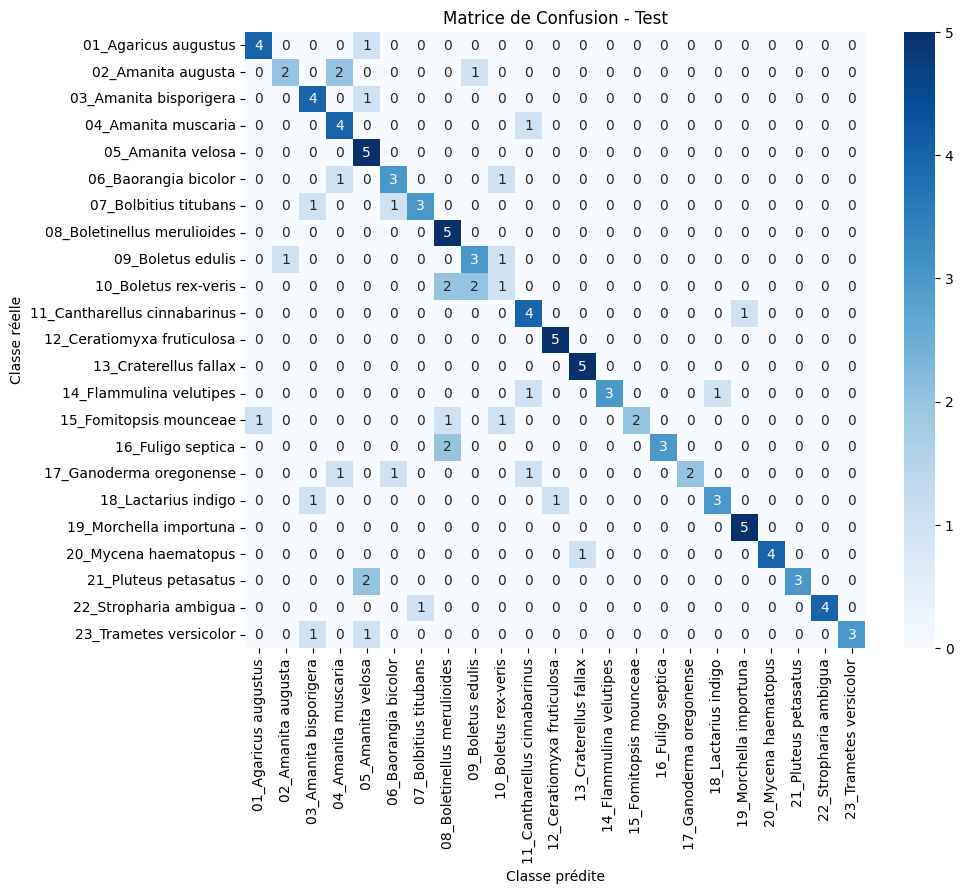

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Définition de la fonction pour afficher la matrice de confusion
def plot_confusion_matrix(conf_matrix, class_labels, title='Matrice de Confusion'):
    """
    Affiche la matrice de confusion en utilisant une heatmap.

    Parameters:
    - conf_matrix (array-like): Matrice de confusion à afficher.
    - class_labels (list): Liste des noms des classes.
    - title (str): Titre de la matrice de confusion.
    """
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel("Classe prédite")
    plt.ylabel("Classe réelle")
    plt.title(title)
    plt.show()

# Prédictions sur l'ensemble de test et obtention des classes vraies
test_dataset = image_dataset_from_directory(
    test_dir,
    batch_size=batch_size,
    image_size=(img_height, img_width),
    shuffle=False  # Assurez-vous que le dataset n'est pas mélangé pour aligner les vraies classes
)

# Obtenez les vraies classes de test
test_true_classes = []
for images, labels in test_dataset:
    test_true_classes.extend(labels.numpy())

# Prédictions du modèle
test_predictions = model.predict(test_dataset)
test_predicted_classes = np.argmax(test_predictions, axis=1)

# Définissez les noms des classes pour l'affichage
class_names = test_dataset.class_names

# Calcul de la matrice de confusion pour l'ensemble de test
conf_matrix_test = confusion_matrix(test_true_classes, test_predicted_classes)

# Affichage de la matrice de confusion
plot_confusion_matrix(conf_matrix_test, class_names, 'Matrice de Confusion - Test')


In [31]:
# *****************************
# ***** Sauvegarde du Modèle *****
# *****************************

# Sauvegarde du modèle complet (architecture, poids, configuration)
model.save('Jarvispore_final_04_11_08_15.h5')  # Sauvegarde le modèle complet

# Sauvegarde des poids uniquement (optionnel)
model.save_weights('Jarvispore_final_04_11_08_15_poids.h5')  # Sauvegarde uniquement les poids du modèle


In [32]:
# *****************************
# ***** Chargement du Modèle *****
# *****************************

# Exemple de chargement du modèle complet
loaded_model = tf.keras.models.load_model('Jarvispore_final_04_11_08_15.h5')  # Charge le modèle complet depuis le fichier sauvegardé

# Exemple de chargement des poids uniquement
#model.load_weightsmodel.save_weights('Jarvispore_final_V2_poids.h5')  # Sauvegarde uniquement les poids du modèle



In [ ]:
#J'ai réalisé un 1er test avec un learning rate de 0.001, mais cela ne fonctionnait pas accuracy à 0.04, j'ai donc mis à 0.0001, j'obtient de meilleurs résultats
#Ce modèle est entraîné sur 20 époques, mais il est possible de l'entraîner sur plus d'époques pour améliorer la précision. Néanmoins le Early Stopping permet d'arrêter l'entraînement si la précision de validation ne s'améliore plus.
#Le modèle est sauvegardé sous le nom 'best_model.keras' et les poids du meilleur modèle sont restaurés automatiquement grâce au callback ModelCheckpoint.
#Le dataset comprends 23 classes, donc la précision aléatoire serait de 1/23 = 0.043, donc 0.04, donc on a un modèle qui fonctionne mieux que le hasard.
#J'ai rajouté une pondération de classe pour tenir compte du déséquilibre des classes dans le dataset. Cela permet de donner plus de poids aux classes sous-représentées lors de l'entraînement.



Classes sélectionnées pour l'affichage Grad-CAM : ['03_Amanita bisporigera', '07_Bolbitius titubans', '17_Ganoderma oregonense', '10_Boletus rex-veris', '12_Ceratiomyxa fruticulosa']
Nom de la dernière couche convolutionnelle pour Grad-CAM : conv2d_9
1/1 [==============================] - 0s 407ms/step


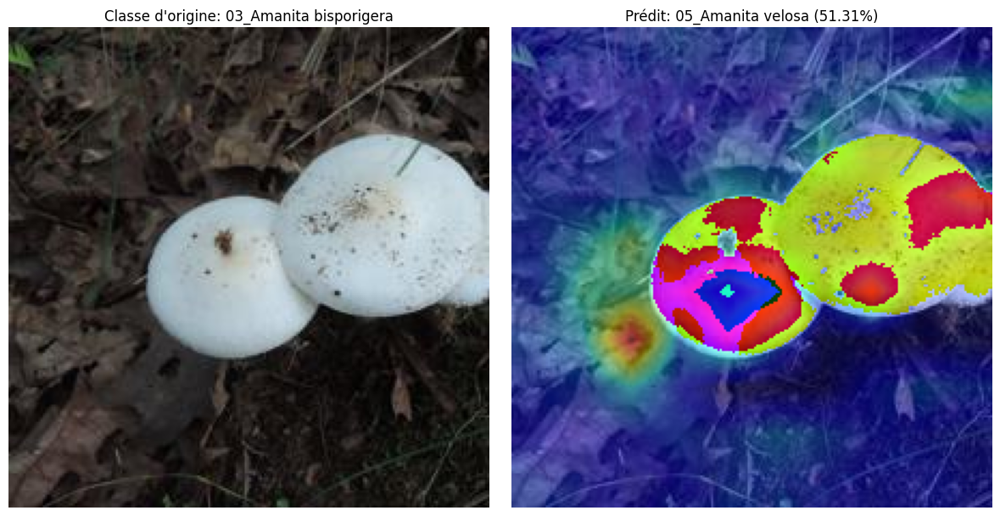

1/1 [==============================] - 0s 12ms/step


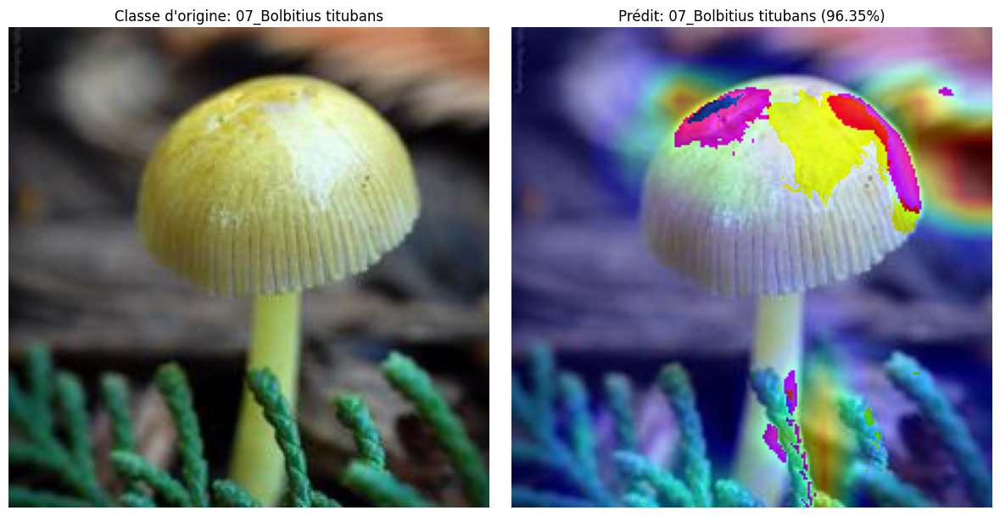

1/1 [==============================] - 0s 13ms/step


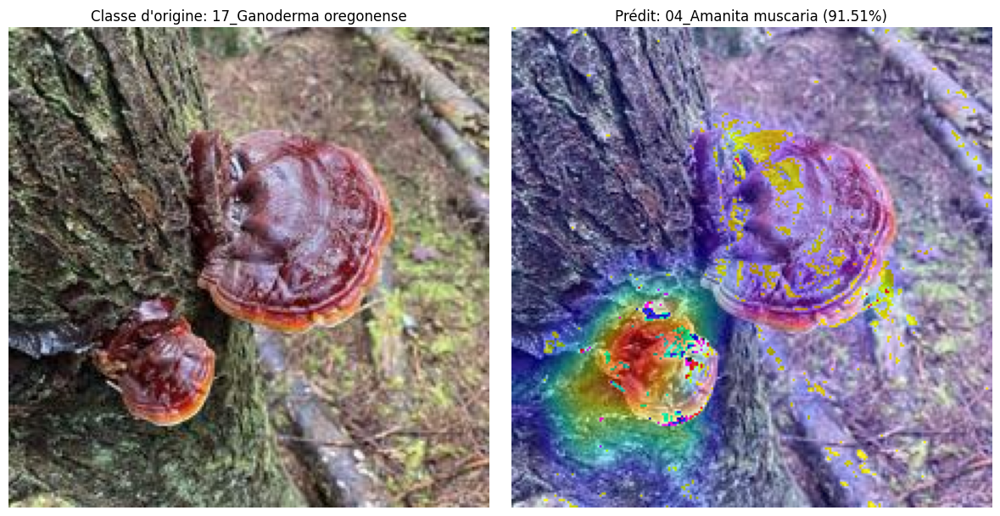

1/1 [==============================] - 0s 12ms/step


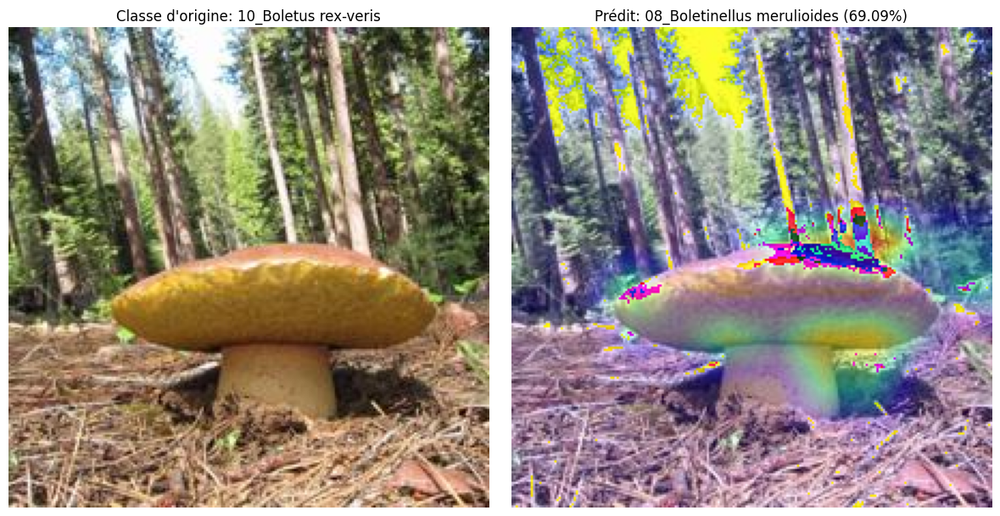

1/1 [==============================] - 0s 14ms/step


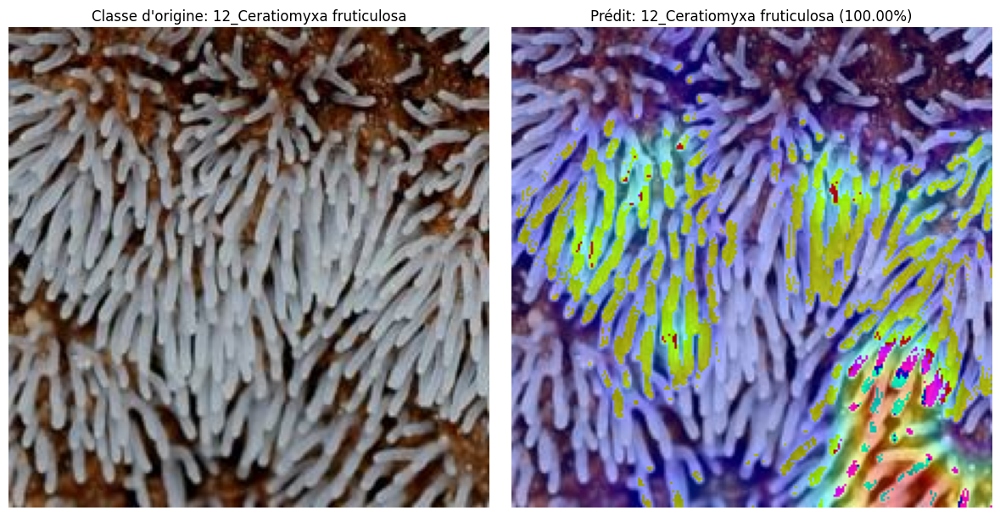

In [33]:
# *****************************
# ***** Sélection Aléatoire d'Images et Génération de Grad-CAM *****
# *****************************

# Sélectionner aléatoirement 5 classes
selected_classes = random.sample(class_names, 5)
print(f"Classes sélectionnées pour l'affichage Grad-CAM : {selected_classes}")

# Dictionnaire pour stocker les chemins des images sélectionnées
selected_images = {}

# Parcourir le dossier de test pour sélectionner une image aléatoire par classe
for class_name in selected_classes:
    class_dir = os.path.join(test_dir, class_name)
    if not os.path.isdir(class_dir):
        print(f"Le répertoire de la classe {class_name} n'existe pas.")
        continue
    images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]
    if len(images) == 0:
        print(f"Aucune image trouvée dans le répertoire de la classe {class_name}.")
        continue
    selected_image = random.choice(images)
    selected_images[class_name] = os.path.join(class_dir, selected_image)

# Afficher et prédire les images sélectionnées avec Grad-CAM
last_conv_layer_name = None

# Trouver la dernière couche convolutionnelle du modèle
for layer in reversed(model.layers):
    if isinstance(layer, layers.Conv2D):
        last_conv_layer_name = layer.name
        break

if last_conv_layer_name is None:
    raise ValueError("Le modèle ne contient aucune couche Conv2D.")

print(f"Nom de la dernière couche convolutionnelle pour Grad-CAM : {last_conv_layer_name}")

# Parcourir les images sélectionnées
for class_name, img_path in selected_images.items():
    try:
        # Charger et prétraiter l'image
        img = Image.open(img_path).convert('RGB')
        img_resized = img.resize((img_width, img_height))
        img_array = tf.keras.preprocessing.image.img_to_array(img_resized)
        img_array = np.expand_dims(img_array, axis=0)  # Ajouter une dimension batch

        # Faire la prédiction
        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions[0])
        predicted_class_name = class_names[predicted_class]
        prediction_prob = predictions[0][predicted_class]

        # Générer la heatmap Grad-CAM
        heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=predicted_class)

        # Superposer la heatmap sur l'image originale
        superimposed_img = superimpose_heatmap(img, heatmap)

        # Créer une figure pour afficher les deux images côte à côte
        plt.figure(figsize=(12, 6))

        # Afficher l'image originale
        plt.subplot(1, 2, 1)
        plt.imshow(img_resized)
        plt.title(f"Classe d'origine: {class_name}")
        plt.axis('off')

        # Afficher l'image avec Grad-CAM
        plt.subplot(1, 2, 2)
        plt.imshow(superimposed_img)
        plt.title(f"Prédit: {predicted_class_name} ({prediction_prob*100:.2f}%)")
        plt.axis('off')

        # Afficher les images
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Erreur lors du traitement de l'image {img_path} : {e}")



Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 12ms/step


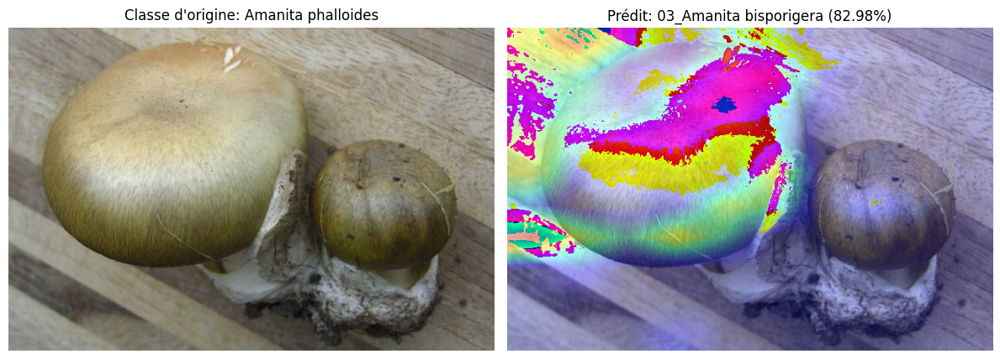


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 11ms/step


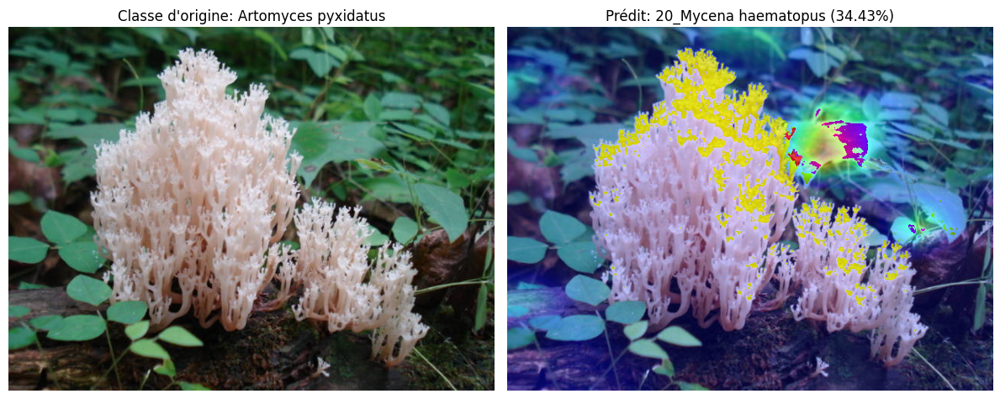


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 12ms/step


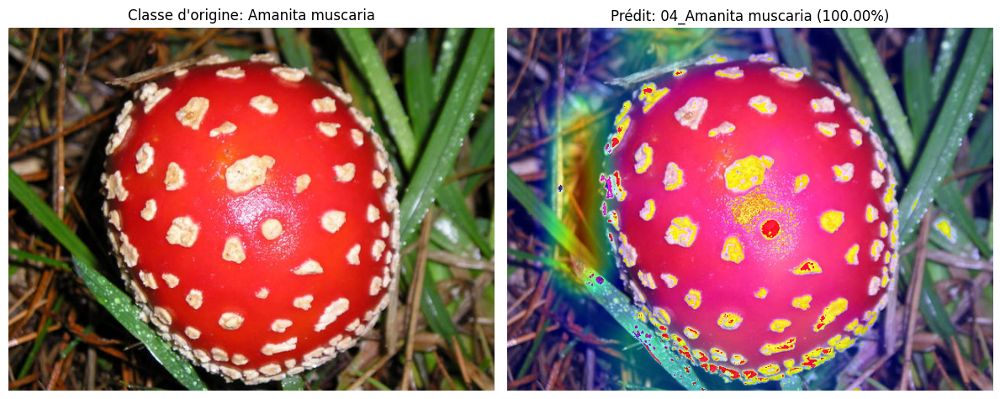


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 11ms/step


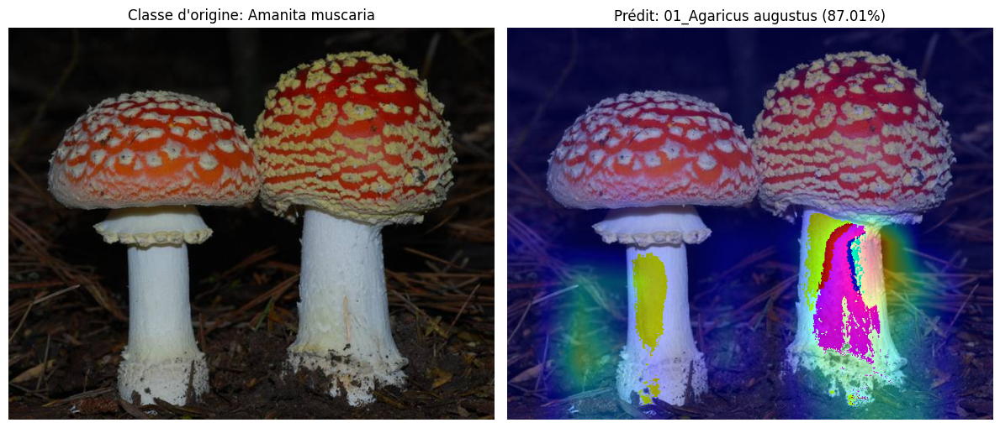


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
Fermeture du programme.


In [37]:
import tkinter as tk
from tkinter import filedialog
import numpy as np
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import os

# Définir les dimensions d'image d'entrée pour le modèle
img_width, img_height = 224, 224

def load_predict_image_tk():
    """
    Ouvre une boîte de dialogue pour sélectionner une image, réalise une prédiction,
    génère Grad-CAM et affiche les résultats.
    """
    # Créer une fenêtre Tkinter cachée pour éviter d'afficher une interface graphique inutile.
    root = tk.Tk()
    root.withdraw()  # Cacher la fenêtre principale pour n'afficher que la boîte de dialogue.

    # Lancer une boîte de dialogue pour que l'utilisateur sélectionne une image.
    file_path = filedialog.askopenfilename(
        title="Sélectionnez une image",
        filetypes=[("Fichiers Image", "*.jpg *.jpeg *.png *.bmp")]
    )

    # Si aucun fichier n'est sélectionné, arrêter la fonction.
    if not file_path:
        print("Aucune image sélectionnée.")
        return

    try:
        # Charger l'image sélectionnée et la convertir en RGB pour standardiser les couleurs.
        img = Image.open(file_path).convert('RGB')

        # Redimensionner l'image en 224x224 pixels pour correspondre aux dimensions d'entrée du modèle
        img_resized = img.resize((img_width, img_height))
        
        # Prétraiter l'image pour le modèle
        img_array = tf.keras.preprocessing.image.img_to_array(img_resized)
        img_array = np.expand_dims(img_array, axis=0)  # Ajouter une dimension batch

        # Extraire le nom de la classe d'origine depuis le chemin du fichier
        class_name = os.path.basename(os.path.dirname(file_path))  # Nom du dossier parent comme nom de classe

        # Faire la prédiction
        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions[0])
        predicted_class_name = class_names[predicted_class]
        prediction_prob = predictions[0][predicted_class]

        # Générer la heatmap Grad-CAM
        heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=predicted_class)

        # Redimensionner la heatmap pour correspondre à la taille de l'image d'origine avant superposition
        heatmap_resized = cv2.resize(heatmap, (img.size[0], img.size[1]))

        # Superposer la heatmap redimensionnée sur l'image d'origine
        superimposed_img = superimpose_heatmap(img, heatmap_resized)

        # Créer une figure pour afficher les deux images côte à côte
        plt.figure(figsize=(12, 6))

        # Afficher l'image d'origine avec la classe
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.title(f"Classe d'origine: {class_name}")
        plt.axis('off')

        # Afficher l'image avec Grad-CAM
        plt.subplot(1, 2, 2)
        plt.imshow(superimposed_img)
        plt.title(f"Prédit: {predicted_class_name} ({prediction_prob*100:.2f}%)")
        plt.axis('off')

        # Afficher les images
        plt.tight_layout()
        plt.show()

    except Exception as e:
        # Afficher un message d'erreur en cas de problème
        print(f"Erreur lors du traitement de l'image {file_path} : {e}")

def superimpose_heatmap(img, heatmap, alpha=0.4):
    """
    Superpose une heatmap Grad-CAM sur une image originale.

    Parameters:
    - img (PIL.Image.Image): Image originale.
    - heatmap (numpy.ndarray): Heatmap Grad-CAM générée.
    - alpha (float): Transparence de la heatmap superposée.

    Returns:
    - PIL.Image.Image: Image superposée avec la heatmap.
    """
    # Appliquer la colormap 'jet' à la heatmap
    heatmap = np.uint8(255 * heatmap)
    jet = plt.get_cmap("jet")
    jet_colors = jet(heatmap)[:, :, :3]  # Ignorer le canal alpha
    jet_heatmap = jet_colors * 255
    jet_heatmap = jet_heatmap.astype(np.uint8)

    # Superposer la heatmap redimensionnée sur l'image d'origine
    superimposed_img = jet_heatmap * alpha + np.array(img)
    superimposed_img = superimposed_img.astype(np.uint8)

    # Convertir en objet PIL Image
    superimposed_img = Image.fromarray(superimposed_img)

    return superimposed_img

def main_interactive():
    """
    Crée une boucle interactive pour permettre à l'utilisateur de charger des images et faire des prédictions.
    """
    while True:
        print("\nOptions :")
        print("1. Charger une image et réaliser une prédiction avec Grad-CAM")
        print("2. Quitter")
        choice = input("Entrez votre choix (1 ou 2) : ")

        # Charger l'image et faire la prédiction si l'utilisateur choisit l'option 1
        if choice == '1':
            load_predict_image_tk()
        elif choice == '2':
            # Quitter le programme
            print("Fermeture du programme.")
            break
        else:
            # Afficher un message si le choix est invalide
            print("Choix invalide. Veuillez entrer 1 ou 2.")

if __name__ == "__main__":
    main_interactive()



Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 11ms/step


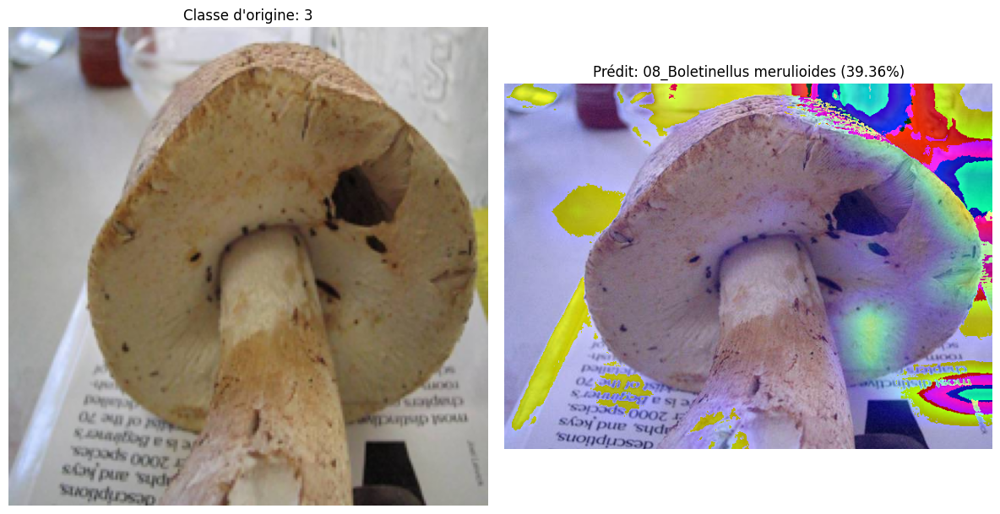


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 11ms/step


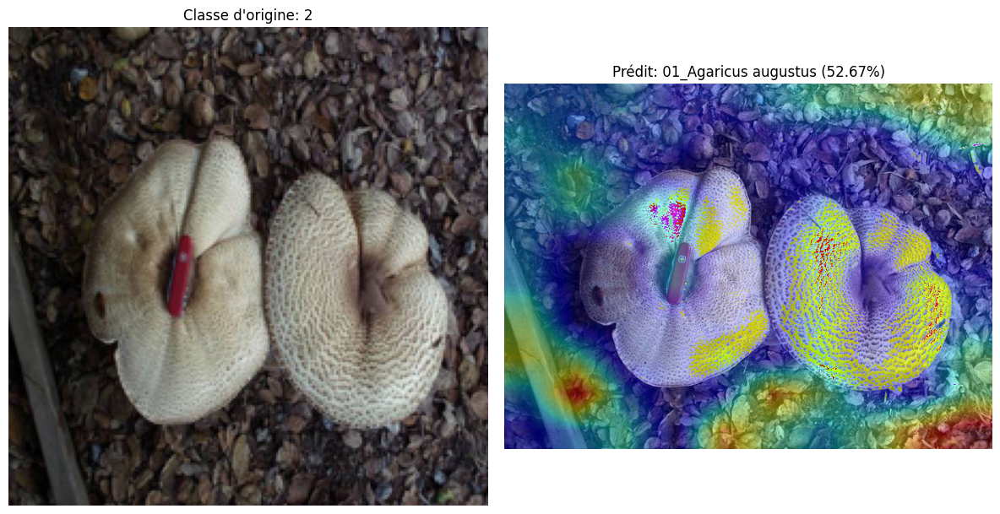


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 11ms/step


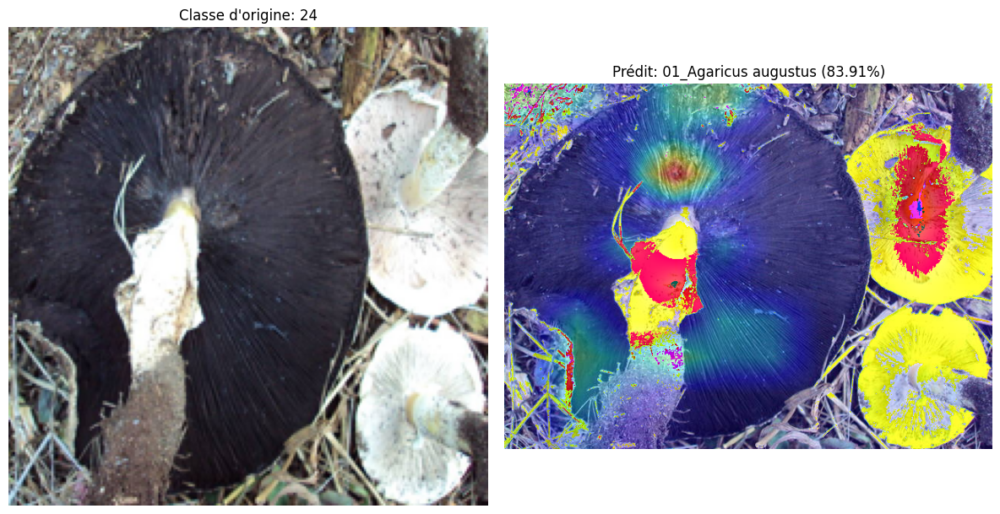


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 11ms/step


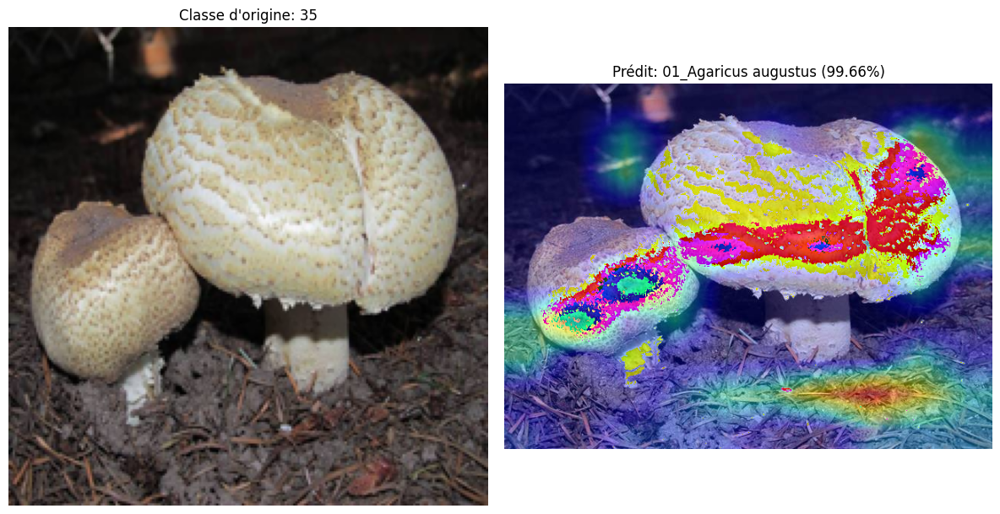


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 11ms/step


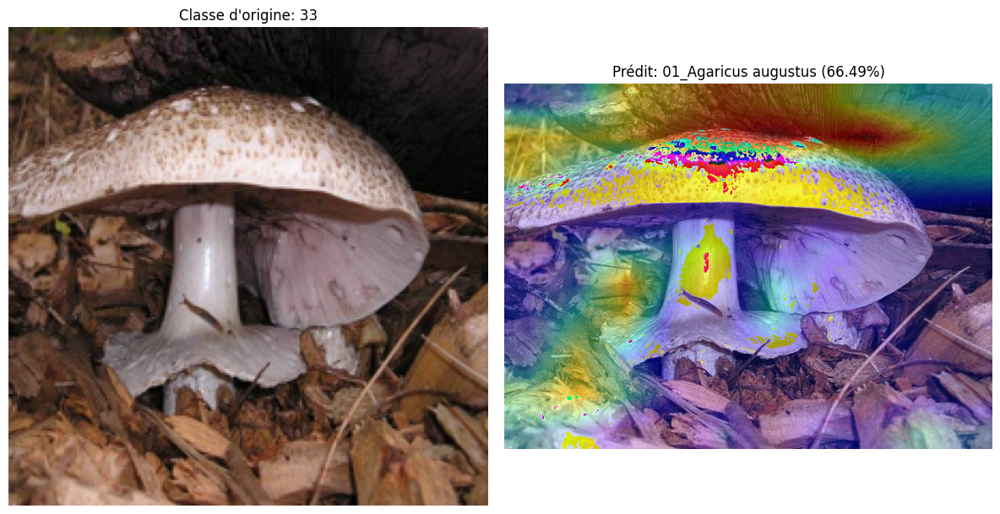


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
1/1 [==============================] - 0s 11ms/step


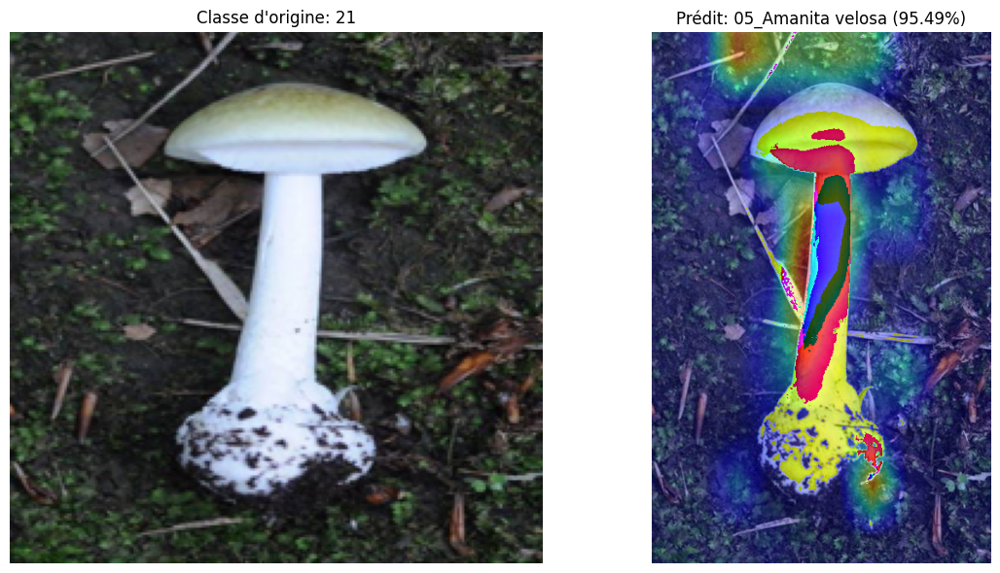


Options :
1. Charger une image et réaliser une prédiction avec Grad-CAM
2. Quitter
Fermeture du programme.


In [36]:
import tkinter as tk
from tkinter import filedialog
import numpy as np
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os

# Définir les dimensions d'image d'entrée pour le modèle
img_width, img_height = 224, 224

def load_predict_image_tk():
    """
    J'ouvre une boîte de dialogue pour sélectionner une image, réalise une prédiction,
    génère Grad-CAM et affiche les résultats.
    """
    # Je crée une fenêtre Tkinter cachée pour éviter d'afficher une interface graphique inutile.
    root = tk.Tk()
    root.withdraw()  # Je cache la fenêtre principale pour n'afficher que la boîte de dialogue.

    # Je lance une boîte de dialogue pour que l'utilisateur sélectionne une image.
    file_path = filedialog.askopenfilename(
        title="Sélectionnez une image",
        filetypes=[("Fichiers Image", "*.jpg *.jpeg *.png *.bmp")]
    )

    # Si aucun fichier n'est sélectionné, j'arrête la fonction.
    if not file_path:
        print("Aucune image sélectionnée.")
        return

    try:
        # Charger l'image sélectionnée et la convertir en RGB pour standardiser les couleurs.
        img = Image.open(file_path).convert('RGB')

        # Redimensionner l'image en 224x224 pixels pour correspondre aux dimensions d'entrée du modèle
        img_resized = img.resize((img_width, img_height))
        
        # Prétraiter l'image pour le modèle
        img_array = tf.keras.preprocessing.image.img_to_array(img_resized)
        img_array = np.expand_dims(img_array, axis=0)  # Ajouter une dimension batch

        # Extraire le nom de la classe d'origine depuis le nom du fichier
        base_filename = os.path.basename(file_path)
        base_filename = os.path.splitext(base_filename)[0]
        class_name = base_filename.split('_', 1)[1] if '_' in base_filename else "Inconnu"

        # Faire la prédiction
        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions[0])
        predicted_class_name = class_names[predicted_class]
        prediction_prob = predictions[0][predicted_class]

        # Générer la heatmap Grad-CAM
        heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=predicted_class)

        # Redimensionner la heatmap pour correspondre à la taille d'origine de l'image avant superposition
        heatmap_resized = cv2.resize(heatmap, (img.size[0], img.size[1]))

        # Superposer la heatmap redimensionnée sur l'image d'origine
        superimposed_img = superimpose_heatmap(img, heatmap_resized)

        # Créer une figure pour afficher les deux images côte à côte
        plt.figure(figsize=(12, 6))

        # Afficher l'image redimensionnée
        plt.subplot(1, 2, 1)
        plt.imshow(img_resized)
        plt.title(f"Classe d'origine: {class_name}")
        plt.axis('off')

        # Afficher l'image avec Grad-CAM
        plt.subplot(1, 2, 2)
        plt.imshow(superimposed_img)
        plt.title(f"Prédit: {predicted_class_name} ({prediction_prob*100:.2f}%)")
        plt.axis('off')

        # Afficher les images
        plt.tight_layout()
        plt.show()

    except Exception as e:
        # Afficher un message d'erreur en cas de problème
        print(f"Erreur lors du traitement de l'image {file_path} : {e}")

def superimpose_heatmap(img, heatmap, alpha=0.4):
    """
    Superpose une heatmap Grad-CAM sur une image originale.

    Parameters:
    - img (PIL.Image.Image): Image originale.
    - heatmap (numpy.ndarray): Heatmap Grad-CAM générée.
    - alpha (float): Transparence de la heatmap superposée.

    Returns:
    - PIL.Image.Image: Image superposée avec la heatmap.
    """
    # Appliquer la colormap 'jet' à la heatmap
    heatmap = np.uint8(255 * heatmap)
    jet = plt.get_cmap("jet")
    jet_colors = jet(heatmap)[:, :, :3]  # Ignorer le canal alpha
    jet_heatmap = jet_colors * 255
    jet_heatmap = jet_heatmap.astype(np.uint8)

    # Superposer la heatmap redimensionnée sur l'image d'origine
    superimposed_img = jet_heatmap * alpha + np.array(img)
    superimposed_img = superimposed_img.astype(np.uint8)

    # Convertir en objet PIL Image
    superimposed_img = Image.fromarray(superimposed_img)

    return superimposed_img

def main_interactive():
    """
    Je crée une boucle interactive pour permettre à l'utilisateur de charger des images et faire des prédictions.
    """
    while True:
        print("\nOptions :")
        print("1. Charger une image et réaliser une prédiction avec Grad-CAM")
        print("2. Quitter")
        choice = input("Entrez votre choix (1 ou 2) : ")

        # Charger l'image et faire la prédiction si l'utilisateur choisit l'option 1
        if choice == '1':
            load_predict_image_tk()
        elif choice == '2':
            # Quitter le programme
            print("Fermeture du programme.")
            break
        else:
            # Afficher un message si le choix est invalide
            print("Choix invalide. Veuillez entrer 1 ou 2.")

if __name__ == "__main__":
    main_interactive()
